In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import json

os.environ["SYNTHEFY_DATASETS_BASE"] = "/Users/raimi/synthefy_data/synthefy_package_datasets" #change this to your path

SYNTHEFY_DATASETS_BASE = os.getenv("SYNTHEFY_DATASETS_BASE")

In [14]:
generated_data = np.load(os.path.join("/Users/raimi/Downloads", "long_term_data_proper_scaling.npy")) # change this to your path - shape is (1, num_channels, num_timestamps)
#open the df so we can get the ground truth BVP
df = pd.read_parquet(os.path.join(SYNTHEFY_DATASETS_BASE, "ppg", "processed_ppg_data_10.parquet")) # change this to your path
#1 subject only
subject_one_only = df[df['subject']=="S1"]


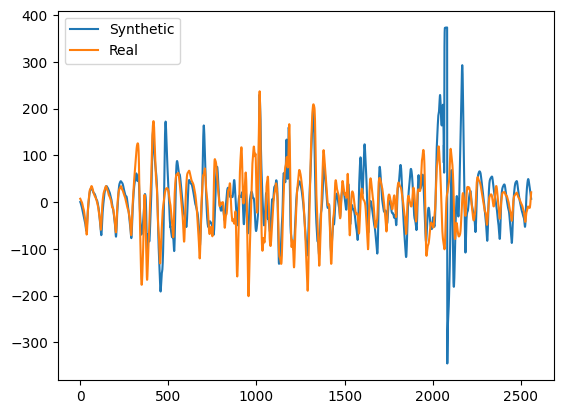

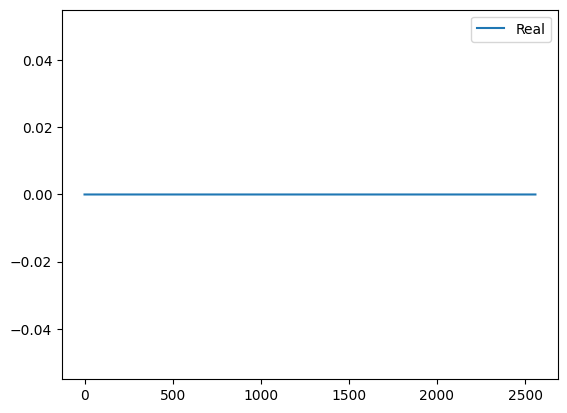

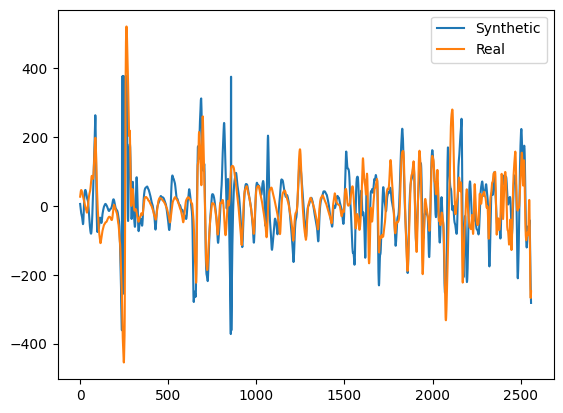

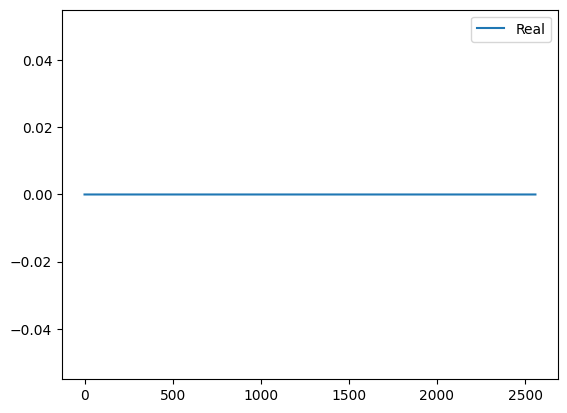

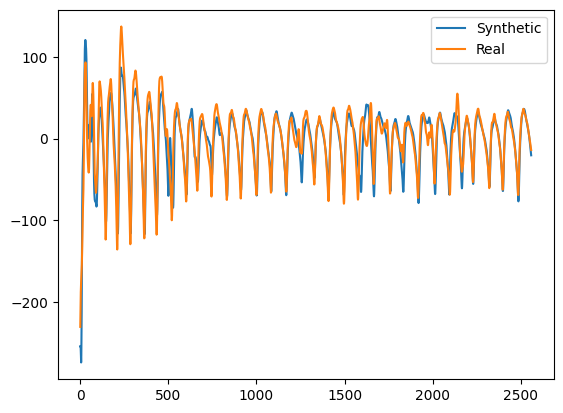

...

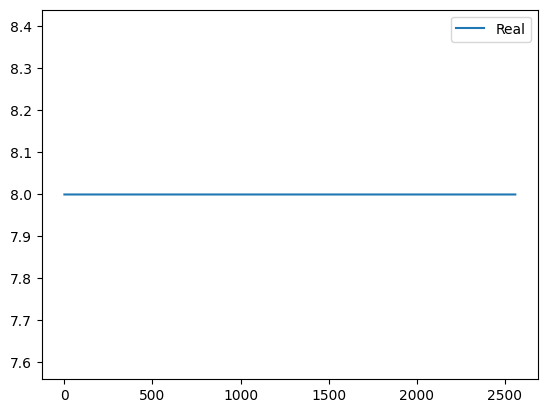

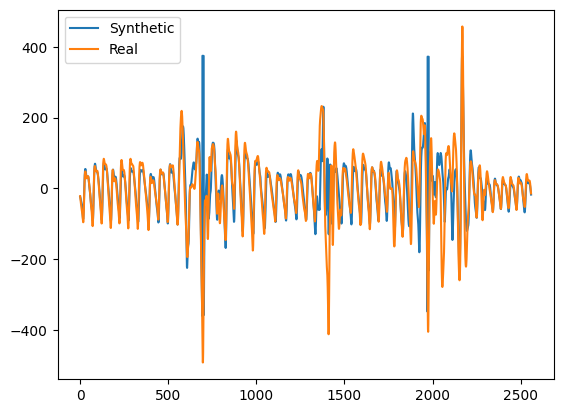

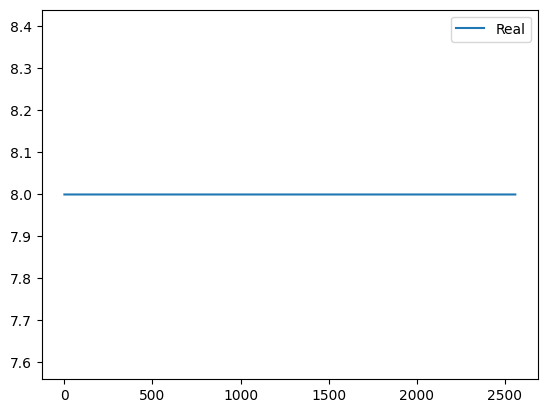

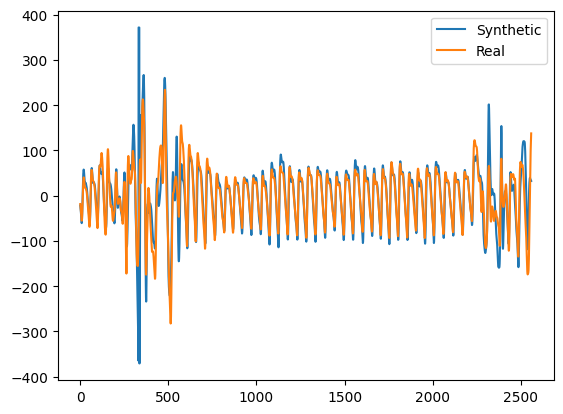

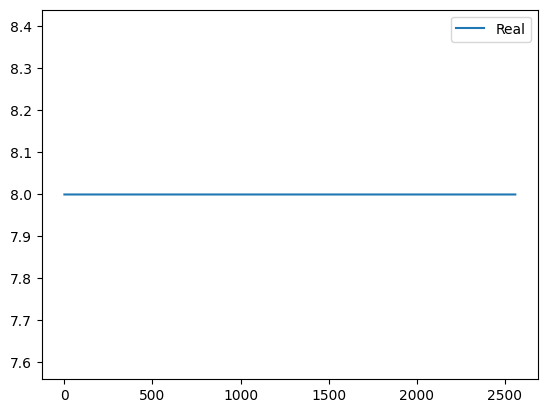

In [15]:
#since BVP was in the original, we can plot to see how good the synthesis is
NUM_TIMESTAMPS_PER_PLOT = 2560

# plot each channel 5120 at a time

timeseries_col = "BVP"
num_timestamps = generated_data.shape[-1]
for i in range(0, num_timestamps, NUM_TIMESTAMPS_PER_PLOT):
    plt.plot(generated_data[0, 0, i : i + NUM_TIMESTAMPS_PER_PLOT], label=f"Synthetic")
    plt.plot(
        subject_one_only['BVP'][i : i + NUM_TIMESTAMPS_PER_PLOT].values,
        label=f"Real",
    )
    plt.legend()
    plt.savefig(f'/tmp/synthesis_plots/comparison_{i}.png')
    plt.show()
    plt.close()

    #plot the activity also 
    plt.plot(subject_one_only['activity'][i : i + NUM_TIMESTAMPS_PER_PLOT].values, label=f"Real")
    plt.legend()
    plt.savefig(f'/tmp/synthesis_plots/activity_{i}.png')
    plt.show()
    plt.close()